# Traitement d'images réaliste (photo)

In [1]:
from matplotlib import pyplot as plt
import numpy as np
import cv2
import itertools

In [2]:
image = cv2.imread("../base_images/papillon.jpg",0)
image_rgb = cv2.imread("../base_images/papillon.jpg",1)
image_rgb = cv2.cvtColor(image_rgb,cv2.COLOR_BGR2RGB)

# Fonctions

**Upscaling**

In [3]:
# Fonction qui augmente la taille de l'image N&B sans interpolation (seulement en agrandissant les pixels) 
def etirement_NB(image, facteur):
    n,p = image.shape
    image_upscaled = np.zeros((n*facteur,p*facteur))
    for i in range(n):
        for j in range(p):
            for k in range(facteur):
                for l in range(facteur):
                    image_upscaled[facteur*i+k,facteur*j+l] = image[i,j]
    return image_upscaled

# Fonction qui augmente la taille de l'image N&B ou RGB sans interpolation (seulement en agrandissant les pixels) 
def etirement(img_rgb, facteur):
    if len(img_rgb.shape) == 3:
        n,p,_ = img_rgb.shape
        res_rgb = np.zeros((n*facteur,p*facteur,3))
        for i in range(3):
            res_rgb[:,:,i] = etirement_NB(img_rgb[:,:,i],facteur)
    else:
        n,p = img_rgb.shape
        res_rgb = np.zeros((n*facteur,p*facteur))
        res_rgb = etirement_NB(img_rgb,facteur)
    return res_rgb.astype(np.int64)

# Interpolation bilinéaire d'images N&B sans gestion des bords droits et bas 
def interpolation_a_la_main_nb_v1(image, facteur):
    d = facteur-1
    n,p = image.shape
    image_upscaled = np.zeros((facteur*n,facteur*p))
    for i in range(n):
        for j in range(p):
            image_upscaled[facteur*i,facteur*j] = image[i,j]
    
    for i in range(n-1):
        for j in range(p-1):
            for k in range(1,facteur):
                image_upscaled[i*facteur+k,j*facteur] = np.round((facteur-k)/facteur*image[i,j] + k/facteur*image[i+1,j])
                image_upscaled[i*facteur,j*facteur+k] = np.round((facteur-k)/facteur*image[i,j] + k/facteur*image[i,j+1])
                for m in range(1,facteur):
                    image_upscaled[i*facteur+k,j*facteur+m] = np.round((facteur-k)/facteur*(facteur-m)/facteur*image[i,j]\
                                                                       +k/facteur*(facteur-m)/facteur*image[i+1,j]\
                                                                       +m/facteur*(facteur-k)/facteur*image[i,j+1]\
                                                                       +k/facteur*m/facteur*image[i+1,j+1])
    return image_upscaled

# Interposaltion sans gestion des bords généralisée aux images RGB
def interpolation_a_la_main_v1(img_rgb, facteur=2):
    res_rgb = np.copy(img_rgb)
    if len(res_rgb.shape) == 3:
        for i in range(3):
            res_rgb[:,:,i] = interpolation_a_la_main_nb_v1(img_rgb[:,:,i],facteur)
    else:
        res_rgb = interpolation_a_la_main_nb_v1(img_rgb,facteur)
    return res_rgb.astype(np.int64)

# Interpolation bilinéraire avec gestion des bords N&B
def interpolation_a_la_main_v2_NB(image, facteur):
    n,p = image.shape
    image_upscaled = np.zeros((facteur*n,facteur*p))
    
    # On écarte les pixels connus
    for i in range(n):
        for j in range(p):
            image_upscaled[facteur*i,facteur*j] = image[i,j]

    # On déduis les pixels restants 
    for i in range(n):
        for j in range(p):
            for k in range(1,facteur):
                if (i*facteur+k <= (n-1)*facteur):
                    image_upscaled[i*facteur+k,j*facteur] = np.round((facteur-k)/facteur*image[i,j] + k/facteur*image[i+1,j])
                if (j*facteur+k <= (p-1)*facteur):
                    image_upscaled[i*facteur,j*facteur+k] = np.round((facteur-k)/facteur*image[i,j] + k/facteur*image[i,j+1])
                if (i*facteur+k <= (n-1)*facteur) and (j*facteur+k <= (p-1)*facteur):
                    for m in range(1,facteur):
                        image_upscaled[i*facteur+k,j*facteur+m] = np.round((facteur-k)/facteur*(facteur-m)/facteur*image[i,j]\
                                                                       +k/facteur*(facteur-m)/facteur*image[i+1,j]\
                                                                       +m/facteur*(facteur-k)/facteur*image[i,j+1]\
                                                                       +k/facteur*m/facteur*image[i+1,j+1])
    
    # On complète les bords
    for k in range(1,facteur):
        for i in range((n-1)*facteur+1):
            image_upscaled[i, (p-1)*facteur + k] = image_upscaled[i, (p-1)*facteur]
        for j in range((p-1)*facteur+1):
            image_upscaled[(n-1)*facteur + k, j] = image_upscaled[(n-1)*facteur, j]
   
    # On complète les créneaux
    for i in range(facteur-1):
        for j in range(facteur-1):
                image_upscaled[(n-1)*facteur + i, (p-1)*facteur + j] = image_upscaled[(n-1)*facteur, (p-1)*facteur]
                
    return image_upscaled

# Interpolation avec gestion des bords RGB
def interpolation_a_la_main_v2_RGB(img_rgb, facteur):
    res = np.zeros((img_rgb.shape[0]*facteur,img_rgb.shape[1]*facteur,3))
    for couleur in range(3):
        res[:,:,couleur] = interpolation_a_la_main_v2_NB(img_rgb[:,:,couleur],facteur)
    return res.astype(np.int64)

# Interpolation avec gestion des bords généralisée
def interpolation_a_la_main_v2(img, facteur=2):
    if len(img.shape) == 3:
        return interpolation_a_la_main_v2_RGB(img, facteur)
    else:
        return interpolation_a_la_main_v2_NB(img, facteur)

**Downscaling**

In [4]:
# Réduction de dimension de l'image N&B en recalculant les pixels à partir d'un fonciton choisie 
def downscaling_NB(img,facteur,fonction):
    w,h = img.shape
    w = w//facteur
    h = h//facteur
    res = np.zeros((w,h))
    for i in range(w):
        i_img = i*facteur
        for j in range(h):
            j_img = j*facteur
            res[i,j] = fonction(img[i_img:i_img+facteur,j_img:j_img+facteur])
    return res

# Réduction de dimension de l'image RGB en recalculant les pixels à partir d'un fonciton choisie 
def downscaling(img_rgb,facteur,fonction):
    if len(img_rgb.shape) == 3:
        n,p,_ = img_rgb.shape
        res_rgb = np.zeros((n//facteur, p//facteur,3))
        for i in range(3):
            res_rgb[:,:,i] = downscaling_NB(img_rgb[:,:,i],facteur,fonction)
    else:
        n,p = img_rgb.shape
        res_rgb = np.zeros((n//facteur, p//facteur))
        res_rgb = downscaling_NB(img_rgb,facteur,fonction)
    return res_rgb.astype(np.int64)

**Filtres simples**

In [5]:
# Applique la convolution de l'image N&B par une fonction (valeur moyenne ou médianne par exemple) sans padding
def convolution_fonction(image,n, filtre):
    source = np.copy(image)
    res = np.copy(image)
    k,l = res.shape
    for i in range(k-n//2):
        for j in range(l-n//2):
            res[i,j] = filtre(source[max(0,i-n//2):min(k,i+n//2+1),max(0,j-n//2):min(l,j+n//2+1)])
    return res

# Convolution de l'image N&B ou RGB avec un filtre moyenneur
def moyenneur(img_rgb,n):
    res_rgb = np.copy(img_rgb)
    if len(res_rgb.shape) == 3:
        for i in range(3):
            res_rgb[:,:,i] = convolution_fonction(img_rgb[:,:,i],n,np.mean)
    else:
        res_rgb = convolution_fonction(img_rgb,n,np.mean)
    return res_rgb.astype(np.int64)

# convolution de l'image N&B ou RGB avec un filtre médian
def median(img_rgb,n):
    res_rgb = np.copy(img_rgb)
    if len(res_rgb.shape) == 3:
        for i in range(3):
            res_rgb[:,:,i] = convolution_fonction(img_rgb[:,:,i],n,np.median)
    else:
        res_rgb = convolution_fonction(img_rgb,n,np.median)
    return res_rgb.astype(np.int64)

# Applique la convolution de l'image par un filtre (gaussien par exemple) avec padding 0
def convolution_filtre(image, filtre):
    n,_ = filtre.shape
    source = np.copy(image)
    source = np.pad(source, (n//2,n//2), 'constant', constant_values=(0,0))
    k,l = image.shape
    res = np.zeros((k,l))
    diff = n//2
    for i in range(k):
        for j in range(l):
            res[i,j] = np.sum(source[i:i+2*diff+1,j:j+2*diff+1]*filtre)
    return res

# Applique la convolution de l'image N&B ou RGB par un filtre 
def convolution(img_rgb, filtre):
    res_rgb = np.copy(img_rgb)
    if len(res_rgb.shape) == 3:
        for i in range(3):
            res_rgb[:,:,i] = convolution_filtre(img_rgb[:,:,i],filtre)
    else:
        res_rgb = convolution_filtre(img_rgb,filtre)
    res_rgb[res_rgb>255]=255
    res_rgb[res_rgb<0]=0
    return res_rgb.astype(np.int64)

# Filtre Sobel
def sobel(img):
    Gx = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
    Gy = np.array([[1,2,1],[0,0,0],[-1,-2,-1]])
    dx = convolution(img,Gx)
    dy = convolution(img,Gy)
    return dx,dy

# Filtre Prewitt
def prewitt(img):
    Gx = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
    Gy = np.array([[1,1,1],[0,0,0],[-1,-1,-1]])
    dx = convolution(img,Gx)
    dy = convolution(img,Gy)
    return dx,dy

# Filtre Laplacien
def laplacien(img):
    kernel = np.array([[0,-1,0],[-1,4,-1],[0,-1,0]])
    f = convolution(img,kernel)
    return f

# Filtre DOG
def dog(img):
    h1 = (1/16)*np.array([[1,1,1],[1,8,1],[1,1,1]])
    h2 = (1/16)*np.array([[1,2,1],[2,4,2],[1,2,1]])
    f1 = convolution(img,h1)
    f2 = convolution(img,h2)
    diff = f1-f2
    return np.sqrt(diff**2+diff**2)

# Seuillage des valeurs de l'image
def seuillage(img,seuil):
    resultat = np.copy(img)
    resultat[resultat<=seuil]=0
    return resultat

**FFT filtering (tentative d'anti-aliasing)**

In [6]:
# FFT filtering N&B
def fft2_filtering_NB(img,kernel):
    fft2 = np.fft.fftshift(np.fft.fft2(img))
    fft2[kernel==0]=1
    return np.abs(np.fft.ifft2(fft2))

# FFT filtering généralisé
def fft2_filtering(img_source,kernel):
    res_rgb = np.copy(img_source)
    if len(res_rgb.shape) == 3:
        res_rgb = np.copy(img_source)
        for i in range(3):
            res_rgb[:,:,i] = fft2_filtering_NB(img_source[:,:,i],kernel).astype(np.int64)
        res_rgb[res_rgb>255]=255
    else:
        res_rgb = fft2_filtering_NB(img_source,kernel).astype(np.int64)
    return res_rgb

**Edge detection**

In [7]:
# Détections de contours d'un image en N&B
def EdgeExtractor_NB(img, method,seuil=-1):
    match method:
        case 'gradient':
            dx, dy = np.gradient(img)
            norm = np.sqrt(dx**2+dy**2)
            
        case 'sobel': 
            dx, dy = sobel(img)
            norm = np.sqrt(dx**2+dy**2)
        
        case 'prewitt': 
            dx, dy = prewitt(img)
            norm = np.sqrt(dx**2+dy**2)
        
        case 'laplacien':
            l = laplacien(img)
            norm = np.sqrt(l**2+l**2)
            
        case 'dog':
            l = laplacien(img)
            norm = np.sqrt(l**2+l**2)
            norm = dog(norm)
            
        case _:
            return -1
    if seuil >= 0:
        norm = seuillage(norm, seuil)
    else:
        ret, norm = cv2.threshold(norm.astype('uint8'), 120, 255, cv2.THRESH_OTSU)
    return norm

# Détection de contours généralisée
def EdgeExtractor(img_source, method,seuil=-1):
    res_rgb = np.copy(img_source)
    if len(res_rgb.shape) == 3:
        for i in range(3):
            res_rgb[:,:,i] = EdgeExtractor_NB(img_source[:,:,i],method, seuil).astype(np.int64)
    else:
        res_rgb = EdgeExtractor_NB(img_source,method, seuil).astype(np.int64)
    res_rgb[res_rgb>255]=255
    return res_rgb

**Sharpening**

In [8]:
# Méthode de sharpening d'une image N&B utilisant un filtre gaussien 
def sharpening_NB(source, kernel):
    image = np.copy(source)
    coarse = convolution(image,kernel)
    fine = image - coarse
    res = fine*3 + coarse
    res[res>255]=255
    res[res<0]=0
    return res

# Méthode de sharpening d'une image généralisée utilisant un filtre gaussien 
def sharpening(img_rgb, kernel):
    res_rgb = np.copy(img_rgb)
    if len(res_rgb.shape) == 3:
        for i in range(3):
            res_rgb[:,:,i] = sharpening_NB(img_rgb[:,:,i], kernel)
    else:
        res_rgb = sharpening_NB(img_rgb, kernel)
    return res_rgb.astype(np.int64)

# Méthode de sharpening d'une image généralisée utilisant une fonction de dérvée comme le laplacien par exemple
def sharpening_by_edges(img, a, fonction):
    i = np.copy(img).astype(np.int16)
    lap = fonction(i, cv2.CV_64F).astype(np.int16)
    retour = np.round(i - a*lap)
    retour[retour>255] = 255
    retour[retour<0] = 0
    return retour.astype(np.int16)

def best_sharpening_by_edges_and_mean(img_ref, img, tab_a, fonction, return_hyper_parameter=False):
    best_mae = 1000000
    best_rmse = 1000000
    best_a = tab_a[0]
    best_res = img
    for a_tmp in tab_a:
        tmp = moyenneur(sharpening_by_edges(img, a_tmp, fonction),3)
        mae_tmp = MAE(img_ref,tmp)
        rmse_tmp = RMSE(img_ref,tmp)
        if (mae_tmp < best_mae) and (rmse_tmp < best_rmse):
            best_mae = mae_tmp
            best_rmse = rmse_tmp
            best_a = a_tmp
            best_res = tmp
            
    if return_hyper_parameter:
        return best_res, best_a
    else:
        return best_res

**Kernels**

In [9]:
# Kernel elliptique
def elliptic_kernel(source,w,h):
    if len(source.shape) == 3:
        x,y,_ = source.shape
    else:
        x,y = source.shape
    return cv2.ellipse(np.zeros((x,y)),(y//2,x//2),(w,h),0,0,360,1,-1)

# Sharpening kernel 
def sharp_kernel(n):
    a = np.zeros((3,3))
    a[1,1]=1
    b = cv2.getStructuringElement(cv2.MORPH_CROSS, (3,3))
    kernel = a+(a-b/5)*n
    return kernel

# Kernel gaussien de côté 3
gaussian_kernel_3 = (1/16)*np.array(((1,2,1),(2,4,2),(1,2,1)))

# Kernel gaussien de côté 5
gaussian_kernel_5 = np.array([[ 0.00059736,  0.00564951,  0.01194726,  0.00564951,  0.00059736],\
       [ 0.00564951,  0.05342979,  0.11299024,  0.05342979,  0.00564951],\
       [ 0.01194726,  0.11299024,  0.23894527,  0.11299024,  0.01194726],\
       [ 0.00564951,  0.05342979,  0.11299024,  0.05342979,  0.00564951],\
       [ 0.00059736,  0.00564951,  0.01194726,  0.00564951,  0.00059736]])

**Noises**

In [10]:
# Bruit poivre et sel de probabilité choisie
def saltAndPepper(img, p):
    res = np.copy(img)
    res_flat = res.ravel()
    size = len(res_flat)
    proba_p = np.random.randint(size*p//4)/size
    p_white = 3*p/4+proba_p
    p_black = 3*p/4-proba_p
    mask = np.random.choice([0,255,1000],len(res_flat),replace='false',p=[p_white,p_black,1-p_white-p_black])
    res_flat[mask<1000]=mask[mask<1000]
    return res

# Bruit gaussien de répartition choisie
def gaussianNoise(img, mean, std):
    res = np.copy(img)
    if len(img.shape) == 3:
        n,p,q = res.shape
        noise = std * np.random.randn(n,p,q) + mean
    else:
        n,p = res.shape
        noise = std * np.random.randn(n,p) + mean
    res = res + noise
    res[res<0]=0
    res[res>255]=255
    return res.astype(np.int16)

**Calcul d'erreurs**

In [11]:
# Root Mean Square Error
def RMSE(x,y):
    return np.sqrt(np.mean((x-y)**2))

# Mean Absolute Error
def MAE(x,y):
    return np.mean(abs(x-y))

# Mean Error
def ME(x,y):
    return np.mean(x-y)

# Résultats 

# Objectif : agrandir l'extrait de l'image sans perdre trop en qualité

In [12]:
I = np.copy(image_rgb[100:300,400:600])
I2 = downscaling(I,2,np.mean)

**Agrandissement de facteur 2 :**

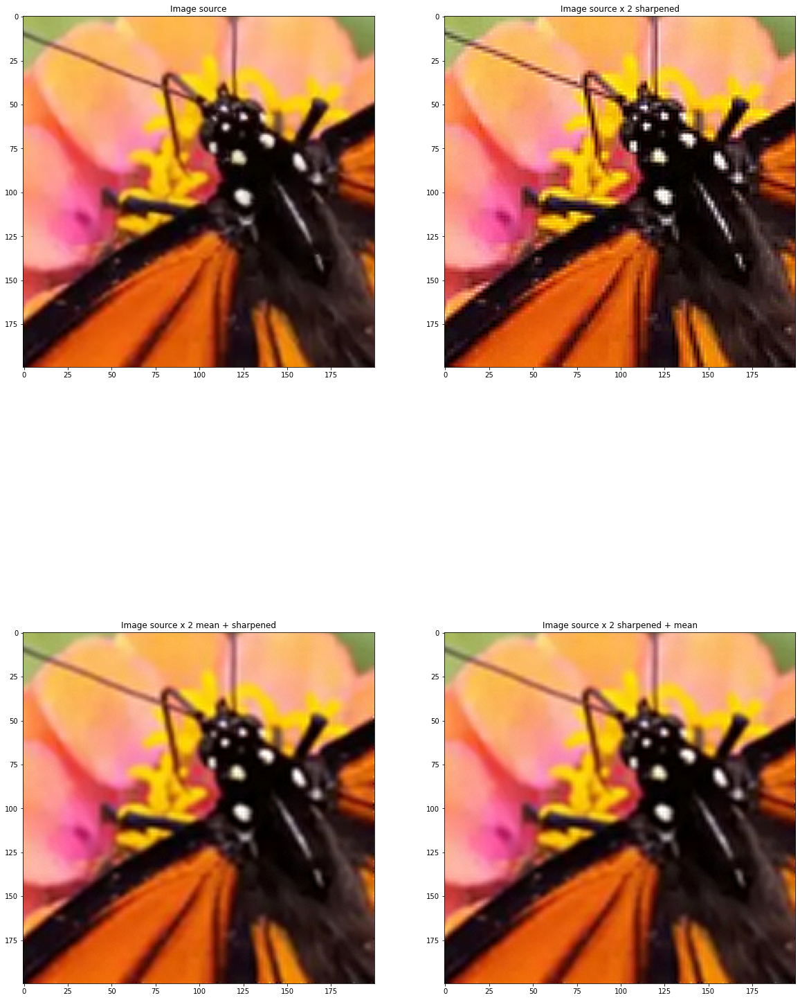

RMSE I et Ix2 =  8.931911889399716
MAE I et Ix2 =  4.79405 

RMSE I et Is2 =  12.586699660090938
MAE I et Is2 =  7.022091666666666 

RMSE I et Ism2 =  8.671986508292088
MAE I et Ism2 =  4.838166666666667 

RMSE I et Ims2 =  8.77358820551774
MAE I et Ims2 =  5.091666666666667 



In [13]:
Ix2 = interpolation_a_la_main_v2(I2,2)
Is2 = sharpening_by_edges(Ix2,1,cv2.Laplacian)
Ism2 = moyenneur(sharpening_by_edges(Ix2,1,cv2.Laplacian),3)
Ims2 = sharpening_by_edges(moyenneur(Ix2,3),1,cv2.Laplacian)

# Affichage
plt.figure(figsize=(20,30))
plt.subplot(2,2,1)
plt.imshow(I)
plt.title('Image source')
plt.subplot(2,2,2)
plt.imshow(Is2)
plt.title('Image source x 2 sharpened')
plt.subplot(2,2,3)
plt.imshow(Ims2)
plt.title('Image source x 2 mean + sharpened')
plt.subplot(2,2,4)
plt.imshow(Ims2)
plt.title('Image source x 2 sharpened + mean')
plt.show()

print("RMSE I et Ix2 = ", RMSE(I,Ix2))
print("MAE I et Ix2 = ", MAE(I,Ix2),"\n")
print("RMSE I et Is2 = ", RMSE(I,Is2))
print("MAE I et Is2 = ", MAE(I,Is2),"\n")
print("RMSE I et Ism2 = ", RMSE(I,Ism2))
print("MAE I et Ism2 = ", MAE(I,Ism2),"\n")
print("RMSE I et Ims2 = ", RMSE(I,Ims2))
print("MAE I et Ims2 = ", MAE(I,Ims2),"\n")

**Agrandissement de facteur 4 (en une étape) :**

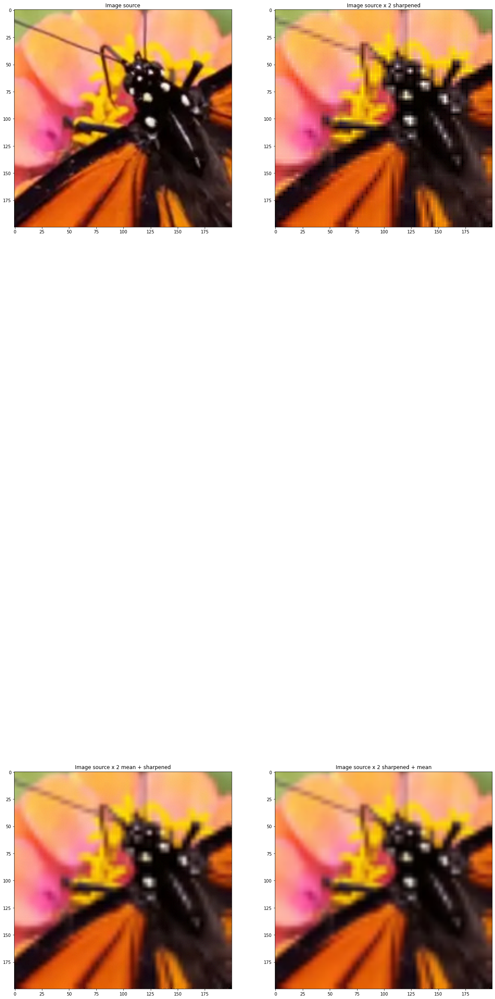

RMSE I et Ix4 =  20.49691928071143
MAE I et Ix4 =  11.5471 

RMSE I et Is4 =  21.379534216940584
MAE I et Is4 =  12.23085 

RMSE I et Ism4 =  20.48213164362212
MAE I et Ism4 =  11.478733333333333 

RMSE I et Ims4 =  20.478049630437628
MAE I et Ims4 =  11.612 



In [14]:
I4 = downscaling(I,4,np.mean)
Ix4 = interpolation_a_la_main_v2(I4,4)
Is4 = sharpening_by_edges(Ix4,1,cv2.Laplacian)
Ism4 = moyenneur(sharpening_by_edges(Ix4,1,cv2.Laplacian),3)
Ims4 = sharpening_by_edges(moyenneur(Ix4,3),1,cv2.Laplacian)

# Affichage
plt.figure(figsize=(20,60))
plt.subplot(2,2,1)
plt.imshow(I)
plt.title('Image source')
plt.subplot(2,2,2)
plt.imshow(Is4)
plt.title('Image source x 2 sharpened')
plt.subplot(2,2,3)
plt.imshow(Ims4)
plt.title('Image source x 2 mean + sharpened')
plt.subplot(2,2,4)
plt.imshow(Ism4)
plt.title('Image source x 2 sharpened + mean')
plt.show()
print("RMSE I et Ix4 = ", RMSE(I,Ix4))
print("MAE I et Ix4 = ", MAE(I,Ix4),"\n")
print("RMSE I et Is4 = ", RMSE(I,Is4))
print("MAE I et Is4 = ", MAE(I,Is4),"\n")
print("RMSE I et Ism4 = ", RMSE(I,Ism4))
print("MAE I et Ism4 = ", MAE(I,Ism4),"\n")
print("RMSE I et Ims4 = ", RMSE(I,Ims4))
print("MAE I et Ims4 = ", MAE(I,Ims4),"\n")

**Agrandissement de facteur 4 (en deux étape) :**

In [15]:
Ix2_1 = interpolation_a_la_main_v2(I4,2)

In [16]:
Is2_1 = sharpening_by_edges(Ix2_1,1,cv2.Laplacian)
Ism2_1 = moyenneur(sharpening_by_edges(Ix2_1,1,cv2.Laplacian),3)
Ims2_1 = sharpening_by_edges(moyenneur(Ix2_1,3),1,cv2.Laplacian)

**Erreurs intermédiaire :**

In [17]:
print("RMSE I2 et Ix2_1 = ", RMSE(I2,Ix2_1))
print("MAE I2 et Ix2_1 = ", MAE(I2,Ix2_1),"\n")
print("RMSE I2 et Is2_1 = ", RMSE(I2,Is2_1))
print("MAE I2 et Is2_1 = ", MAE(I2,Is2_1),"\n")
print("RMSE I2 et Ism2_1 = ", RMSE(I2,Ism2_1))
print("MAE I2 et Ism2_1 = ", MAE(I2,Ism2_1),"\n")
print("RMSE I2 et Ims2_1 = ", RMSE(I2,Ims2_1))
print("MAE I2 et Ims2_1 = ", MAE(I2,Ims2_1),"\n")

RMSE I2 et Ix2_1 =  15.365590345530714
MAE I2 et Ix2_1 =  8.6345 

RMSE I2 et Is2_1 =  20.83080571333396
MAE I2 et Is2_1 =  12.175133333333333 

RMSE I2 et Ism2_1 =  15.107724293662939
MAE I2 et Ism2_1 =  8.706666666666667 

RMSE I2 et Ims2_1 =  15.001556585901344
MAE I2 et Ims2_1 =  8.768633333333334 



**Cas Is**

In [18]:
Ix4_1 = interpolation_a_la_main_v2(Is2_1,2)
Is4_1 = sharpening_by_edges(Ix4_1,1,cv2.Laplacian)
Ism4_1 = moyenneur(sharpening_by_edges(Ix4_1,1,cv2.Laplacian),3)
Ims4_1 = sharpening_by_edges(moyenneur(Ix4_1,3),1,cv2.Laplacian)

In [19]:
print("RMSE I et Ix4_1 = ", RMSE(I,Ix4_1))
print("MAE I et Ix4_1 = ", MAE(I,Ix4_1),"\n")
print("RMSE I et Is4_1 = ", RMSE(I,Is4_1))
print("MAE I et Is4_1 = ", MAE(I,Is4_1),"\n")
print("RMSE I et Ism4_1 = ", RMSE(I,Ism4_1))
print("MAE I et Ism4_1 = ", MAE(I,Ism4_1),"\n")
print("RMSE I et Ims4_1 = ", RMSE(I,Ims4_1))
print("MAE I et Ims4_1 = ", MAE(I,Ims4_1),"\n")

RMSE I et Ix4_1 =  23.98415883453076
MAE I et Ix4_1 =  13.477941666666666 

RMSE I et Is4_1 =  29.403340938290217
MAE I et Is4_1 =  17.928958333333334 

RMSE I et Ism4_1 =  24.240561565277318
MAE I et Ism4_1 =  13.859141666666666 

RMSE I et Ims4_1 =  25.90647087762695
MAE I et Ims4_1 =  15.005683333333334 



**Cas Ism**

In [20]:
Ix4_2 = interpolation_a_la_main_v2(Ism2_1,2)
Is4_2 = sharpening_by_edges(Ix4_2,1,cv2.Laplacian)
Ism4_2 = moyenneur(sharpening_by_edges(Ix4_2,1,cv2.Laplacian),3)
Ims4_2 = sharpening_by_edges(moyenneur(Ix4_2,3),1,cv2.Laplacian)

In [21]:
print("RMSE I et Ix4_2 = ", RMSE(I,Ix4_2))
print("MAE I et Ix4_2 = ", MAE(I,Ix4_2),"\n")
print("RMSE I et Is4_2 = ", RMSE(I,Is4_2))
print("MAE I et Is4_2 = ", MAE(I,Is4_2),"\n")
print("RMSE I et Ism4_2 = ", RMSE(I,Ism4_2))
print("MAE I et Ism4_2 = ", MAE(I,Ism4_2),"\n")
print("RMSE I et Ims4_2 = ", RMSE(I,Ims4_2))
print("MAE I et Ims4_2 = ", MAE(I,Ims4_2),"\n")

RMSE I et Ix4_2 =  20.436066565429527
MAE I et Ix4_2 =  11.685383333333334 

RMSE I et Is4_2 =  21.56821136920414
MAE I et Is4_2 =  12.624691666666667 

RMSE I et Ism4_2 =  20.672582285078306
MAE I et Ism4_2 =  11.880641666666667 

RMSE I et Ims4_2 =  20.74104445296813
MAE I et Ims4_2 =  12.048008333333334 



**Cas Ims**

In [22]:
Ix4_3 = interpolation_a_la_main_v2(Ism2_1,2)
Is4_3 = sharpening_by_edges(Ix4_3,1,cv2.Laplacian)
Ism4_3 = moyenneur(sharpening_by_edges(Ix4_3,1,cv2.Laplacian),3)
Ims4_3 = sharpening_by_edges(moyenneur(Ix4_3,3),1,cv2.Laplacian)

In [23]:
print("RMSE I et Ix4_3 = ", RMSE(I,Ix4_3))
print("MAE I et Ix4_3 = ", MAE(I,Ix4_3),"\n")
print("RMSE I et Is4_3 = ", RMSE(I,Is4_3))
print("MAE I et Is4_3 = ", MAE(I,Is4_3),"\n")
print("RMSE I et Ism4_3 = ", RMSE(I,Ism4_3))
print("MAE I et Ism4_3 = ", MAE(I,Ism4_3),"\n")
print("RMSE I et Ims4_3 = ", RMSE(I,Ims4_3))
print("MAE I et Ims4_3 = ", MAE(I,Ims4_3),"\n")

RMSE I et Ix4_3 =  20.436066565429527
MAE I et Ix4_3 =  11.685383333333334 

RMSE I et Is4_3 =  21.56821136920414
MAE I et Is4_3 =  12.624691666666667 

RMSE I et Ism4_3 =  20.672582285078306
MAE I et Ism4_3 =  11.880641666666667 

RMSE I et Ims4_3 =  20.74104445296813
MAE I et Ims4_3 =  12.048008333333334 



**Affichage Cas Is**

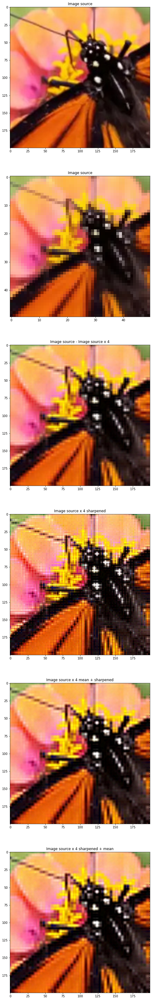

In [24]:
plt.figure(figsize=(20,60))
plt.subplot(6,1,1)
plt.imshow(I)
plt.title('Image source')

plt.subplot(6,1,2)
plt.imshow(I4)
plt.title('Image source')

plt.subplot(6,1,3)
plt.imshow(Ix4_1)
plt.title('Image source - Image source x 4')

plt.subplot(6,1,4)
plt.imshow(Is4_1)
plt.title('Image source x 4 sharpened')

plt.subplot(6,1,5)
plt.imshow(Ims4_1)
plt.title('Image source x 4 mean + sharpened')

plt.subplot(6,1,6)
plt.imshow(Ims4_1)
plt.title('Image source x 4 sharpened + mean')

plt.show()

**Affichage Cas Ism**

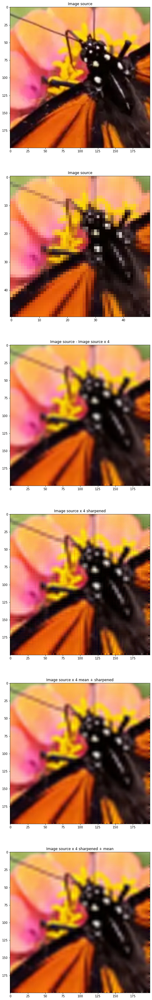

In [25]:
plt.figure(figsize=(20,60))
plt.subplot(6,1,1)
plt.imshow(I)
plt.title('Image source')

plt.subplot(6,1,2)
plt.imshow(I4)
plt.title('Image source')

plt.subplot(6,1,3)
plt.imshow(Ix4_2)
plt.title('Image source - Image source x 4')

plt.subplot(6,1,4)
plt.imshow(Is4_2)
plt.title('Image source x 4 sharpened')

plt.subplot(6,1,5)
plt.imshow(Ims4_2)
plt.title('Image source x 4 mean + sharpened')

plt.subplot(6,1,6)
plt.imshow(Ims4_2)
plt.title('Image source x 4 sharpened + mean')

plt.show()

**Affichage Cas Ims**

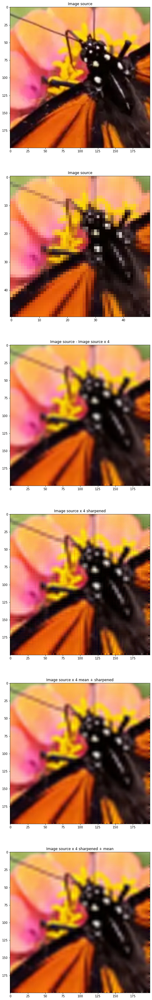

In [26]:
plt.figure(figsize=(20,60))
plt.subplot(6,1,1)
plt.imshow(I)
plt.title('Image source')

plt.subplot(6,1,2)
plt.imshow(I4)
plt.title('Image source')

plt.subplot(6,1,3)
plt.imshow(Ix4_3)
plt.title('Image source - Image source x 4')

plt.subplot(6,1,4)
plt.imshow(Is4_3)
plt.title('Image source x 4 sharpened')

plt.subplot(6,1,5)
plt.imshow(Ims4_3)
plt.title('Image source x 4 mean + sharpened')

plt.subplot(6,1,6)
plt.imshow(Ims4_3)
plt.title('Image source x 4 sharpened + mean')

plt.show()

# Comparatif des méthodes avec un facteur 2

In [27]:
# Fonction permettant de comparer les méthodes 
def comparatif_methodes(I,facteur, afficher=False):
    # Ensemble des méthodes
    methodes = []
    nom_methodes = []
    tab_MAE = []
    tab_RMSE = []
    
    # Downscaling
    I_source2 = downscaling(I,facteur,np.mean)
    
    # Méthode 1 (étirement simple)
    m1 = etirement(I_source2,facteur)
    print("Méthode 1 (étirement) :\n        MAE = "+str(MAE(I,m1))+" | RMSE = "+str(RMSE(I,m1))+"\n")
    methodes.append(m1)
    tab_MAE.append(MAE(I,m1))
    tab_RMSE.append(RMSE(I,m1))
    nom_methodes.append("Méthode 1 (étirement)")
    
    # Méthode 2 (interpolation bilinéaire à la main)
    m2 = interpolation_a_la_main_v2(I_source2,facteur)
    print("Méthode 2 (interpolation bilinéaire à la main) :\n        MAE = "+str(MAE(I,m2))+" | RMSE = "+str(RMSE(I,m2))+"\n")
    methodes.append(m2)
    tab_MAE.append(MAE(I,m2))
    tab_RMSE.append(RMSE(I,m2))
    nom_methodes.append("Méthode 2 (interpolation bilinéaire à la main)")
        
    # Méthode 3 (interpolation > sharpening par différence avec un filtre gaussien 3x3)
    m3 = sharpening(m2,gaussian_kernel_3)
    print("Méthode 3 (interpolation > sharpening par différence avec un filtre gaussien 3x3) :\n        MAE = "+str(MAE(I,m3))+" | RMSE = "+str(RMSE(I,m3))+"\n")
    methodes.append(m3)
    tab_MAE.append(MAE(I,m3))
    tab_RMSE.append(RMSE(I,m3))
    nom_methodes.append("Méthode 3 (interpolation > sharpening par différence avec un filtre gaussien 3x3)")
    
    # Méthode 4 (interpolation > sharpening par différence avec un filtre gaussien 5x5)
    m4 = sharpening(m2,gaussian_kernel_5)
    print("Méthode 4 (interpolation > sharpening par différence avec un filtre gaussien 5x5) :\n        MAE = "+str(MAE(I,m4))+" | RMSE = "+str(RMSE(I,m4))+"\n")
    methodes.append(m4)
    tab_MAE.append(MAE(I,m4))
    tab_RMSE.append(RMSE(I,m4))
    nom_methodes.append("Méthode 4 (interpolation > sharpening par différence avec un filtre gaussien 5x5)")
    
    # Méthode 5 (interpolation > sharpening par convolution avec un filtre de sharpening)
    m5 = convolution(m2,sharp_kernel(2))
    print("Méthode 5 (interpolation > sharpening par convolution avec un filtre de sharpening) :\n        MAE = "+str(MAE(I,m5))+" | RMSE = "+str(RMSE(I,m5))+"\n")
    methodes.append(m5)
    tab_MAE.append(MAE(I,m5))
    tab_RMSE.append(RMSE(I,m5))
    nom_methodes.append("Méthode 5 (interpolation > sharpening par convolution avec un filtre de sharpening)")
    
    # Méthode 6 (interpolation > sharpening par différence avec le Laplacien)
    m6 = sharpening_by_edges(m2, 0.6, cv2.Laplacian)
    print("Méthode 6 (interpolation > sharpening par différence avec le Laplacien :\n        MAE = "+str(MAE(I,m6))+" | RMSE = "+str(RMSE(I,m6))+"\n")
    methodes.append(m6)
    tab_MAE.append(MAE(I,m6))
    tab_RMSE.append(RMSE(I,m6))
    nom_methodes.append("Méthode 6 (interpolation > sharpening par différence avec le Laplacien)")
    
    # Méthode 7 (interpolation > antialiasing par filtrage fft2)
    m7 = fft2_filtering(m2, elliptic_kernel(m2,600,314))
    print("Méthode 7 (interpolation > antialiasing par filtrage fft2) :\n        MAE = "+str(MAE(I,m7))+" | RMSE = "+str(RMSE(I,m7))+"\n")
    methodes.append(m7)
    tab_MAE.append(MAE(I,m7))
    tab_RMSE.append(RMSE(I,m7))
    nom_methodes.append("Méthode 7 (interpolation > antialiasing par filtrage fft2)")
    
    # Méthode 8 (interpolation > sharpening par différence avec un filtre gaussien 3x3 > moyennage 3x3)
    m8 = moyenneur(m3,3)
    print("Méthode 8 (interpolation > sharpening par différence avec un filtre gaussien 3x3 > moyennage 3x3) :\n        MAE = "+str(MAE(I,m8))+" | RMSE = "+str(RMSE(I,m8))+"\n")
    methodes.append(m8)
    tab_MAE.append(MAE(I,m8))
    tab_RMSE.append(RMSE(I,m8))
    nom_methodes.append("Méthode 8 (interpolation > sharpening par différence avec un filtre gaussien 3x3 > moyennage 3x3)")
    
    # Méthode 9 (interpolation > sharpening par différence avec un filtre gaussien 5x5 > moyennage 3x3)
    m9 = moyenneur(m4,3)
    print("Méthode 9 (interpolation > sharpening par différence avec un filtre gaussien 5x5 > moyennage 3x3) :\n        MAE = "+str(MAE(I,m9))+" | RMSE = "+str(RMSE(I,m9))+"\n")
    methodes.append(m9)
    tab_MAE.append(MAE(I,m9))
    tab_RMSE.append(RMSE(I,m9))
    nom_methodes.append("Méthode 9 (interpolation > sharpening par différence avec un filtre gaussien 5x5 > moyennage 3x3)")
    
    # Méthode 10 (interpolation > sharpening par convolution avec un filtre de sharpening > moyennage 3x3)
    m10 = moyenneur(m5,3)
    print("Méthode 10 (interpolation > sharpening par convolution avec un filtre de sharpening > moyennage 3x3) :\n        MAE = "+str(MAE(I,m10))+" | RMSE = "+str(RMSE(I,m10))+"\n")
    methodes.append(m10)
    tab_MAE.append(MAE(I,m10))
    tab_RMSE.append(RMSE(I,m10))
    nom_methodes.append("Méthode 10 (interpolation > sharpening par convolution avec un filtre de sharpening > moyennage 3x3)")
    
    # Méthode 11 (interpolation > sharpening par différence avec le Laplacien > moyennage 3x3)
    m11 = moyenneur(sharpening_by_edges(m2, .74375, cv2.Laplacian),3)    
    print("Méthode 11 (interpolation > sharpening par différence avec le Laplacien > moyennage 3x3) :\n        MAE = "+str(MAE(I,m11))+" | RMSE = "+str(RMSE(I,m11))+"\n")
    methodes.append(m11)
    tab_MAE.append(MAE(I,m11))
    tab_RMSE.append(RMSE(I,m11))
    nom_methodes.append("Méthode 11 (interpolation > sharpening par différence avec le Laplacien > moyennage 3x3)")
    
    # Méthode 12 (interpolation > antialiasing par filtrage fft2 > moyennage 3x3)
    m12 = moyenneur(m7,3)
    print("Méthode 12 (interpolation > antialiasing par filtrage fft2 > moyennage 3x3) :\n        MAE = "+str(MAE(I,m12))+" | RMSE = "+str(RMSE(I,m12))+"\n")
    methodes.append(m12)
    tab_MAE.append(MAE(I,m12))
    tab_RMSE.append(RMSE(I,m12))
    nom_methodes.append("Méthode 12 (interpolation > antialiasing par filtrage fft2 > moyennage 3x3)")
    
    # Méthode 13 (interpolation > sharpening par différence avec un filtre gaussien 3x3 > antialiasing par filtrage fft2)
    m13 = fft2_filtering(m3, elliptic_kernel(m3,600,314))
    print("Méthode 13 (interpolation > sharpening par différence avec un filtre gaussien 3x3 > antialiasing par filtrage fft2) :\n        MAE = "+str(MAE(I,m13))+" | RMSE = "+str(RMSE(I,m13))+"\n")
    methodes.append(m13)
    tab_MAE.append(MAE(I,m13))
    tab_RMSE.append(RMSE(I,m13))
    nom_methodes.append("Méthode 13 (interpolation > sharpening par différence avec un filtre gaussien 3x3 > antialiasing par filtrage fft2)")
    
    # Méthode 14 (interpolation > sharpening par différence avec un filtre gaussien 5x5 > antialiasing par filtrage fft2)
    m14 = fft2_filtering(m4, elliptic_kernel(m4,600,314))
    print("Méthode 14 (interpolation > sharpening par différence avec un filtre gaussien 5x5 > antialiasing par filtrage fft2) :\n        MAE = "+str(MAE(I,m14))+" | RMSE = "+str(RMSE(I,m14))+"\n")
    methodes.append(m14)
    tab_MAE.append(MAE(I,m14))
    tab_RMSE.append(RMSE(I,m14))
    nom_methodes.append("Méthode 14 (interpolation > sharpening par différence avec un filtre gaussien 5x5 > antialiasing par filtrage fft2)")
    
    # Méthode 15 (interpolation > sharpening par convolution avec un filtre de sharpening > antialiasing par filtrage fft2)
    m15 = fft2_filtering(m5, elliptic_kernel(m5,600,314))
    print("Méthode 15 (interpolation > sharpening par convolution avec un filtre de sharpening > antialiasing par filtrage fft2) :\n        MAE = "+str(MAE(I,m15))+" | RMSE = "+str(RMSE(I,m15))+"\n")
    methodes.append(m15)
    tab_MAE.append(MAE(I,m15))
    tab_RMSE.append(RMSE(I,m15))
    nom_methodes.append("Méthode 15 (interpolation > sharpening par convolution avec un filtre de sharpening > antialiasing par filtrage fft2)")
    
    # Méthode 16 (interpolation > sharpening par différence avec le Laplacien > antialiasing par filtrage fft2)
    m16 = fft2_filtering(m6, elliptic_kernel(m6,600,314))    
    print("Méthode 16 (interpolation > sharpening par différence avec le Laplacien > antialiasing par filtrage fft2) :\n        MAE = "+str(MAE(I,m16))+" | RMSE = "+str(RMSE(I,m16))+"\n")
    methodes.append(m16)
    tab_MAE.append(MAE(I,m16))
    tab_RMSE.append(RMSE(I,m16))
    nom_methodes.append("Méthode 16 (interpolation > sharpening par différence avec le Laplacien > antialiasing par filtrage fft2)")
    
    # Méthode 17 (interpolation > sharpening par différence avec un filtre gaussien 3x3 > antialiasing par filtrage fft2 > moyennage 3x3)
    m17 = moyenneur(fft2_filtering(m3, elliptic_kernel(m3,100,200)),3)
    print("Méthode 17 (interpolation > sharpening par différence avec un filtre gaussien 3x3 > antialiasing par filtrage fft2 > moyennage 3x3) :\n        MAE = "+str(MAE(I,m17))+" | RMSE = "+str(RMSE(I,m17))+"\n")
    methodes.append(m17)
    tab_MAE.append(MAE(I,m17))
    tab_RMSE.append(RMSE(I,m17))
    nom_methodes.append("Méthode 17 (interpolation > sharpening par différence avec un filtre gaussien 3x3 > antialiasing par filtrage fft2 > moyennage 3x3)")
    
    # Méthode 18 (interpolation > sharpening par différence avec un filtre gaussien 5x5 > antialiasing par filtrage fft2 > moyennage 3x3)
    m18 = moyenneur(fft2_filtering(m4, elliptic_kernel(m4,600,314)),3)
    print("Méthode 18 (interpolation > sharpening par différence avec un filtre gaussien 5x5 > antialiasing par filtrage fft2 > moyennage 3x3) :\n        MAE = "+str(MAE(I,m18))+" | RMSE = "+str(RMSE(I,m18))+"\n")
    methodes.append(m18)
    tab_MAE.append(MAE(I,m18))
    tab_RMSE.append(RMSE(I,m18))
    nom_methodes.append("Méthode 18 (interpolation > sharpening par différence avec un filtre gaussien 5x5 > antialiasing par filtrage fft2 > moyennage 3x3)")
    
    # Méthode 19 (interpolation > sharpening par convolution avec un filtre de sharpening > antialiasing par filtrage fft2 > moyennage 3x3)
    m19 = moyenneur(fft2_filtering(m5, elliptic_kernel(m5,600,314)),3)
    print("Méthode 19 (interpolation > sharpening par convolution avec un filtre de sharpening > antialiasing par filtrage fft2 > moyennage 3x3) :\n        MAE = "+str(MAE(I,m19))+" | RMSE = "+str(RMSE(I,m19))+"\n")
    methodes.append(m19)
    tab_MAE.append(MAE(I,m19))
    tab_RMSE.append(RMSE(I,m19))
    nom_methodes.append("Méthode 19 (interpolation > sharpening par convolution avec un filtre de sharpening > antialiasing par filtrage fft2 > moyennage 3x3)")
    
    # Méthode 20 (interpolation > sharpening par différence avec le Laplacien > antialiasing par filtrage fft2 > moyennage 3x3)
    m20 = moyenneur(fft2_filtering(m6, elliptic_kernel(m6,600,314)),3)    
    print("Méthode 20 (interpolation > sharpening par différence avec le Laplacien > antialiasing par filtrage fft2 > moyennage 3x3) :\n        MAE = "+str(MAE(I,m20))+" | RMSE = "+str(RMSE(I,m20))+"\n")
    methodes.append(m20)
    tab_MAE.append(MAE(I,m20))
    tab_RMSE.append(RMSE(I,m20))
    nom_methodes.append("Méthode 20 (interpolation > sharpening par différence avec le Laplacien > antialiasing par filtrage fft2 > moyennage 3x3)")
    
    # Méthode 21 (interpolation > sharpening par différence avec un filtre gaussien 3x3 > median 3x3)
    m21 = median(m3,3)
    print("Méthode 21 (interpolation > sharpening par différence avec un filtre gaussien 3x3 > median 3x3) :\n        MAE = "+str(MAE(I,m21))+" | RMSE = "+str(RMSE(I,m21))+"\n")
    methodes.append(m21)
    tab_MAE.append(MAE(I,m21))
    tab_RMSE.append(RMSE(I,m21))
    nom_methodes.append("Méthode 21 (interpolation > sharpening par différence avec un filtre gaussien 3x3 > median 3x3)")
    
    # Méthode 22 (interpolation > sharpening par différence avec un filtre gaussien 5x5 > median 3x3)
    m22 = median(m4,3)
    print("Méthode 22 (interpolation > sharpening par différence avec un filtre gaussien 5x5 > median 3x3) :\n        MAE = "+str(MAE(I,m22))+" | RMSE = "+str(RMSE(I,m22))+"\n")
    methodes.append(m22)
    tab_MAE.append(MAE(I,m22))
    tab_RMSE.append(RMSE(I,m22))
    nom_methodes.append("Méthode 22 (interpolation > sharpening par différence avec un filtre gaussien 5x5 > median 3x3)")
    
    # Méthode 23 (interpolation > sharpening par convolution avec un filtre de sharpening > median 3x3)
    m23 = median(m5,3)
    print("Méthode 23 (interpolation > sharpening par convolution avec un filtre de sharpening > median 3x3) :\n        MAE = "+str(MAE(I,m23))+" | RMSE = "+str(RMSE(I,m23))+"\n")
    methodes.append(m23)
    tab_MAE.append(MAE(I,m23))
    tab_RMSE.append(RMSE(I,m23))
    nom_methodes.append("Méthode 23 (interpolation > sharpening par convolution avec un filtre de sharpening > median 3x3)")
    
    # Méthode 24 (interpolation > sharpening par différence avec le Laplacien > median 3x3)
    m24 = median(m6,3)    
    print("Méthode 24 (interpolation > sharpening par différence avec le Laplacien > median 3x3) :\n        MAE = "+str(MAE(I,m24))+" | RMSE = "+str(RMSE(I,m24))+"\n")
    methodes.append(m24)
    tab_MAE.append(MAE(I,m24))
    tab_RMSE.append(RMSE(I,m24))
    nom_methodes.append("Méthode 24 (interpolation > sharpening par différence avec le Laplacien > median 3x3)")
    
    
    # Affichage
    if afficher:
        N = len(methodes)
        
        plt.figure(figsize=(20,10*(N+2)))

        plt.subplot(N+2,1,1)
        plt.imshow(I)
        plt.title('Image source')

        plt.subplot(N+2,1,2)
        plt.imshow(I2)
        plt.title('Image après downscaling de facteur '+str(facteur))

        for i,m in enumerate(methodes):
            plt.subplot(N+2,1,i+3)
            plt.imshow(m)
            plt.title(nom_methodes[i])

        plt.show()
    return methodes,nom_methodes,tab_MAE,tab_RMSE

In [28]:
methodes, noms, tab_MAE, tab_RMSE = comparatif_methodes(image, 2, afficher=False)

Méthode 1 (étirement) :
        MAE = 1.7752468152866243 | RMSE = 4.763358687655292

Méthode 2 (interpolation bilinéaire à la main) :
        MAE = 1.9708227176220807 | RMSE = 5.166304093161267

Méthode 3 (interpolation > sharpening par différence avec un filtre gaussien 3x3) :
        MAE = 2.90526008492569 | RMSE = 7.434973410701238

Méthode 4 (interpolation > sharpening par différence avec un filtre gaussien 5x5) :
        MAE = 3.104993365180467 | RMSE = 7.585654639933734

Méthode 5 (interpolation > sharpening par convolution avec un filtre de sharpening) :
        MAE = 2.6986080148619958 | RMSE = 6.757835646276156

Méthode 6 (interpolation > sharpening par différence avec le Laplacien :
        MAE = 2.694311305732484 | RMSE = 6.175461357907995

Méthode 7 (interpolation > antialiasing par filtrage fft2) :
        MAE = 2.249144108280255 | RMSE = 5.238694859625989

Méthode 8 (interpolation > sharpening par différence avec un filtre gaussien 3x3 > moyennage 3x3) :
        MAE = 2.2

# Gardons la meilleure méthode

**Meilleure méthode retenue (méthode 11) :** interpolation > sharpening par différence avec le Laplacien > moyennage 3x3 ou median 3x3

On cherche à se rapprocher un maximum des erreurs calculées auparavent avec cette méthode (Moyennage | Median): 

MAE = 2.137 | 2.031

RMSE = 5.016 | 5.281

In [29]:
def methode_retenue(img_ref, img, facteur, afficher=False):
    # Calcul
    img_interpolated = interpolation_a_la_main_v2(img,facteur)
    img_sharpened = sharpening_by_edges(img_interpolated, .74375, cv2.Laplacian) 
    img_finished_mean = moyenneur(img_sharpened,3)
    img_finished_median = median(img_sharpened,3)
    
    # Affichage
    print("Erreur après interpolation : \n        MAE = "+str(MAE(img_ref, img_interpolated))+" | RMSE = "+str(RMSE(img_ref, img_interpolated)))
    # print("Erreur après sharpening : \n        MAE = "+str(MAE(img_ref, img_sharpened))+" | RMSE = "+str(RMSE(img_ref, img_sharpened)))
    print("Erreur à la fin du traitement avec moyennage : \n        MAE = "+str(MAE(img_ref, img_finished_mean))+" | RMSE = "+str(RMSE(img_ref, img_finished_mean)))
    print("Erreur à la fin du traitement avec median : \n        MAE = "+str(MAE(img_ref, img_finished_median))+" | RMSE = "+str(RMSE(img_ref, img_finished_median)))
    
    if afficher:
        plt.figure(figsize=(20,30))
        plt.subplot(3,1,1)
        plt.title("Image source")
        plt.imshow(img_ref, 'gray')
        plt.subplot(3,1,2)
        plt.title("Image traitée avec moyennage")
        plt.imshow(img_finished_mean, 'gray')
        plt.subplot(3,1,3)
        plt.title("Image traitée avec median")
        plt.imshow(img_finished_median, 'gray')
    
    return img_finished_mean, img_finished_median
image_source = image
I_downscaled = downscaling(np.copy(image_source),2,np.mean)

**Mise en application sur l'image bruitée :**

**Salt & pepper 3%**

Erreur après interpolation : 
        MAE = 7.363277600849257 | RMSE = 22.34484181964147
Erreur à la fin du traitement avec moyennage : 
        MAE = 7.592811836518047 | RMSE = 17.00269925960365
Erreur à la fin du traitement avec median : 
        MAE = 5.289164012738853 | RMSE = 16.320495545196056


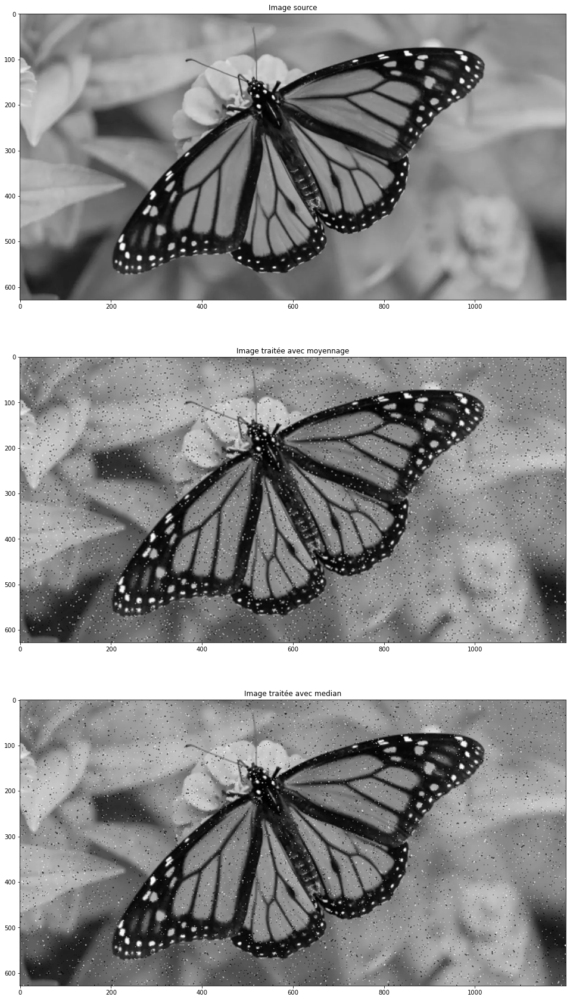

In [30]:
Isp1 = saltAndPepper(I_downscaled, .03)
IspTraitee1_mean, IspTraitee1_median  = methode_retenue(image_source, Isp1, 2, afficher=True)

**Salt & pepper 5%**

In [31]:
Isp2 = saltAndPepper(I_downscaled, .05)
IspTraitee2_mean, IspTraitee2_median = methode_retenue(image_source, Isp2, 2)

Erreur après interpolation : 
        MAE = 10.83312898089172 | RMSE = 28.511733253540008
Erreur à la fin du traitement avec moyennage : 
        MAE = 10.789860668789808 | RMSE = 21.425759189516103
Erreur à la fin du traitement avec median : 
        MAE = 7.7818444798301485 | RMSE = 21.140622277909415


**Salt & pepper 10%**

In [32]:
Isp3 = saltAndPepper(I_downscaled, .1)
IspTraitee3_mean, IspTraitee3_median = methode_retenue(image_source, Isp3, 2)

Erreur après interpolation : 
        MAE = 19.05992701698514 | RMSE = 39.98474256186794
Erreur à la fin du traitement avec moyennage : 
        MAE = 17.751252653927814 | RMSE = 29.722340261421397
Erreur à la fin du traitement avec median : 
        MAE = 14.530084925690021 | RMSE = 30.572393896741136


**Salt & pepper 20%**

In [33]:
Isp4 = saltAndPepper(I_downscaled, .2)
IspTraitee4_mean, IspTraitee4_median = methode_retenue(image_source, Isp4, 2)

Erreur après interpolation : 
        MAE = 34.91863455414013 | RMSE = 57.57922840564824
Erreur à la fin du traitement avec moyennage : 
        MAE = 29.60149548832272 | RMSE = 42.454568901916296
Erreur à la fin du traitement avec median : 
        MAE = 29.12060907643312 | RMSE = 46.10213298036982


**Salt & pepper 30%**

In [34]:
Isp5 = saltAndPepper(I_downscaled, .3)
IspTraitee5_mean, IspTraitee5_median = methode_retenue(image_source, Isp5, 2)

Erreur après interpolation : 
        MAE = 49.0354432059448 | RMSE = 70.82786994042134
Erreur à la fin du traitement avec moyennage : 
        MAE = 38.77813561571125 | RMSE = 51.78270025193902
Erreur à la fin du traitement avec median : 
        MAE = 43.393878715498936 | RMSE = 59.56109326519115


**Bruit Gaussien de moyenne 0 et de variance 5**

Erreur après interpolation : 
        MAE = 4.0772200106157115 | RMSE = 6.439392745268234
Erreur à la fin du traitement avec moyennage : 
        MAE = 4.246129246284501 | RMSE = 6.415475562927023
Erreur à la fin du traitement avec median : 
        MAE = 3.9238747346072187 | RMSE = 6.424467230300575


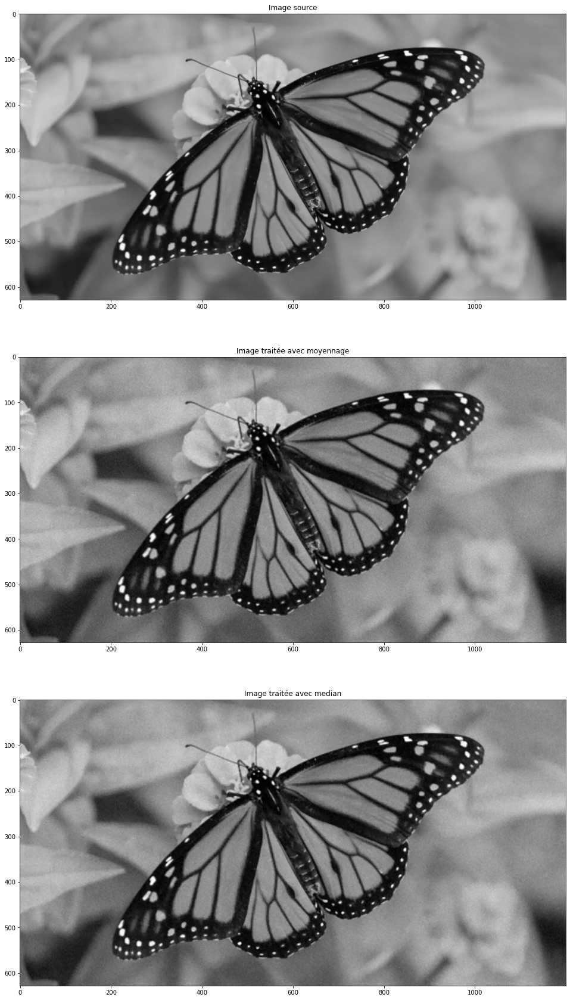

In [35]:
Ig1 = gaussianNoise(I_downscaled, 0, 5)
IgTraitee1_mean, IgTraitee1_median = methode_retenue(image_source, Ig1, 2, afficher=True)

**Bruit Gaussien de moyenne 0 et de variance 10**

In [36]:
Ig2 = gaussianNoise(I_downscaled, 0, 10)
IgTraitee2_mean, IgTraitee2_median = methode_retenue(image_source, Ig2, 2)

Erreur après interpolation : 
        MAE = 6.6772598195329085 | RMSE = 9.12465112906659
Erreur à la fin du traitement avec moyennage : 
        MAE = 6.938235138004246 | RMSE = 9.199930766840025
Erreur à la fin du traitement avec median : 
        MAE = 6.196240711252654 | RMSE = 8.687789693347707


**Bruit Gaussien de moyenne 5 et de variance 10**

In [37]:
Ig3 = gaussianNoise(I_downscaled, 5, 10)
IgTraitee3_mean, IgTraitee3_median = methode_retenue(image_source, Ig3, 2)

Erreur après interpolation : 
        MAE = 7.552246549893843 | RMSE = 9.990876079210903
Erreur à la fin du traitement avec moyennage : 
        MAE = 7.584927016985138 | RMSE = 9.90940712264326
Erreur à la fin du traitement avec median : 
        MAE = 7.145148619957538 | RMSE = 9.574921906296536


**Bruit Gaussien de moyenne 0 et de variance 20**

In [38]:
Ig4 = gaussianNoise(I_downscaled, 0, 20)
IgTraitee4_mean, IgTraitee4_median = methode_retenue(image_source, Ig4, 2)

Erreur après interpolation : 
        MAE = 12.077837048832272 | RMSE = 15.698396996477804
Erreur à la fin du traitement avec moyennage : 
        MAE = 12.504884554140128 | RMSE = 15.858298886623833
Erreur à la fin du traitement avec median : 
        MAE = 10.954628450106156 | RMSE = 14.374662647199996


**Bruit Gaussien de moyenne 5 et de variance 20**

In [39]:
Ig5 = gaussianNoise(I_downscaled, 5, 20)
IgTraitee5_mean, IgTraitee5_median = methode_retenue(image_source, Ig5, 2)

Erreur après interpolation : 
        MAE = 12.616244692144374 | RMSE = 16.321871519990417
Erreur à la fin du traitement avec moyennage : 
        MAE = 12.95374601910828 | RMSE = 16.41265099829799
Erreur à la fin du traitement avec median : 
        MAE = 11.543580148619958 | RMSE = 15.05231508740253


# Conclusion

On peut conclure que le filtre médian donne de meilleurs résultats que le filtre moyenneur en RMSE et MAE sur des images avec un bruit gaussien fort ou léger et sur les images avec un bruit salt and pepper léger (inférieur à 10%), au dessus de ce seuil le filtre moyenneur donne de meilleurs résultats. 

De plus, avec ou sans bruit on remarque que notre méthode (interpolation > sharpening avec le Laplacien > convolution avec un filtre moyen ou median 3x3) d'agrandissement de l'image permet d'obtenir une plus petite erreur qu'avec une interpolation. De plus, le résultat visuel est moins flou que celui de l'interpolation simple et l'image paraît naturelle. Notre méthode permet donc d'améliorer le résultat aussi bien sur le plan mathématique que subjectif.